# **Семинар: Введение в XAI**

Лектор: Садиех Сабрина
[Channel ](https://t.me/jdata_blog)


# **Содержание**
1-3. Графические методы: ICE, PDP, ALE \
4. Корреляция признаков и влияние на методы интерпретации \
5. Статистические методы: permutation importance \
6. Суррогатные модели: LIME-style \
6.1. Сравнение локальных объяснений для разных объектов \
7. SHAP  \
8. Задания для самостоятельной работы


## **1. Обучение моделей и анализ данных**

В задаче объяснения нам всегда нужен объект — **что объяснять**, поэтому XAI всегда работает с обученными моделями. Факт обучения или дообучения (finetuning) даёт нам возможность исследовать достаточно большое поле гипотез от базовых задач:

*какие признаки в модели наиболее значимы?*

до более высокоуровневых:

*как instruct finetuning влияет на aligment модели?*

Высокоуровневые задачи начинаюися с базы. Поэтому то, что мы пройдем в этой практике, на самом деле, как понятие числа в математике — основа.

In [1]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Здесь мы просто обучим модели на стандартном наборе данных
# я рассчитываю, что вы уже изучили процесс обучения ML моделей на прошлых уроках, поэтому эта ячейка скорее вспомогательная

data = load_breast_cancer()
X = data.data
y = data.target
feature_names = data.feature_names

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

logreg = make_pipeline(StandardScaler(), LogisticRegression(max_iter=500, random_state=42)) # обратите внимание на машстбирование здесь
rf = RandomForestClassifier(n_estimators=300, random_state=42)

logreg.fit(X_train, y_train)
rf.fit(X_train, y_train)

for name, model in [('LogReg', logreg), ('RandomForest', rf)]:
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    print(name)
    print("Accuracy:", round(accuracy_score(y_test, y_pred), 4))
    print("ROC AUC :", round(roc_auc_score(y_test, y_proba), 4))
    print()


LogReg
Accuracy: 0.986
ROC AUC : 0.9977

RandomForest
Accuracy: 0.958
ROC AUC : 0.9949



Модели есть — ближе посмотрим на данные.

In [3]:
pd_data = pd.DataFrame(data.data, columns=data.feature_names)
pd_data.head(3)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.0,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


Зафиксируем разный числовой масштаб признаков. Это — причина масштабирования данных для линейной модели. На самом деле — регрессия обладает простой и понятной интерпретацией по определению — вес признака указывает на его вклад в прогноз. То же самое справедливо для Generalized Linear Models (GLM далее) (пример GLM — логистическая регрессия), но с некоторыми модификациями для анализа весов.

Однако, если упустить момент машстабирования интепретация любых алгоримтов, основанных на расстоянии или весах становится не валидной — одни признаки имеют изначально более большие координаты, а значит мы заставляем веса учитывать их, вместе со вкладом признака.


Данные — всегда двигатель того, что изучила моделей. Многое можно объяснить данными и много экспрериментов можно *проделать правильно и корректно подобрав данные.* Это тема для других уроков, но просто зафиксируйте это для себя.

## **2. Графический вклад: ICE (Individual Conditional Expectation), Partial Dependence Plot (PDP) и Ceteris Paribus Profiles**

Посмотрим, как работают графические методы.Напомню, что:
- CPO — профили, которые показывают, как меняется прогноз при изменении конкретного признака. CPO — работают с одним объектом;
- ICE  — продолжение CPO, и они визуализируют
поведение модели для
нескольких объектов,
показывая, как предсказания
изменяются при варьировании
одного признака, когда
остальные зафиксированы;
- PDP — профили, которые показывают, как меняется прогноз при изменении конкретного признака, усредняя ICE.


ICE и PDP реализованы в sklearn, так что воспользуемся этими реализациями.


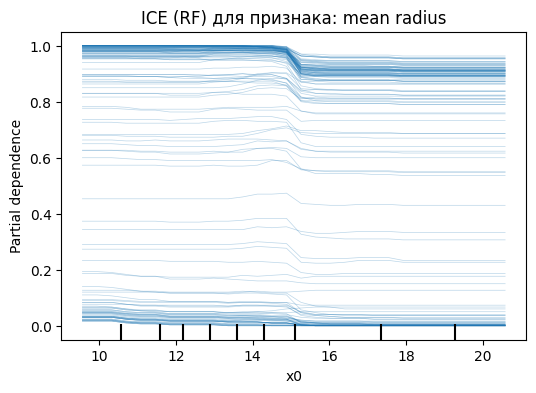

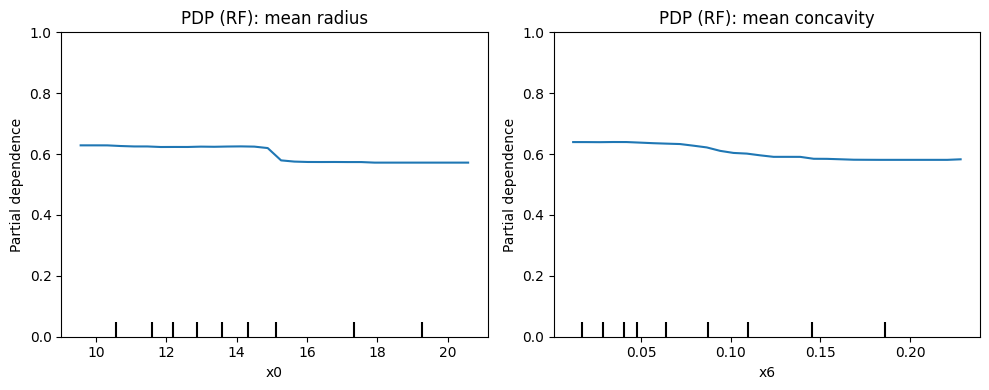

In [22]:
from sklearn.inspection import PartialDependenceDisplay

feat_idx_ice = [0, 6]

# ICE для случайного леса
fig_ice, ax = plt.subplots(figsize=(6,4))
PartialDependenceDisplay.from_estimator(
    rf, X_test, features=[feat_idx_ice[0]], kind="individual", grid_resolution=30, ax=ax
)
ax.set_title(f"ICE (RF) для признака: {feature_names[feat_idx_ice[0]]}")
plt.show()

# PDP для двух признаков
fig_pdp, axes = plt.subplots(1, 2, figsize=(10,4))
PartialDependenceDisplay.from_estimator(rf, X_test, [0, 6], ax=axes, grid_resolution=30)
axes[0].set_title(f"PDP (RF): {feature_names[0]}")
axes[1].set_title(f"PDP (RF): {feature_names[6]}")

for ax in axes:
  ax.set_ylim(0, 1) # чтобы масштаб отображения изменений был верный

plt.tight_layout()
plt.show()


ICE + PDP на одном графике для признака mean_redius

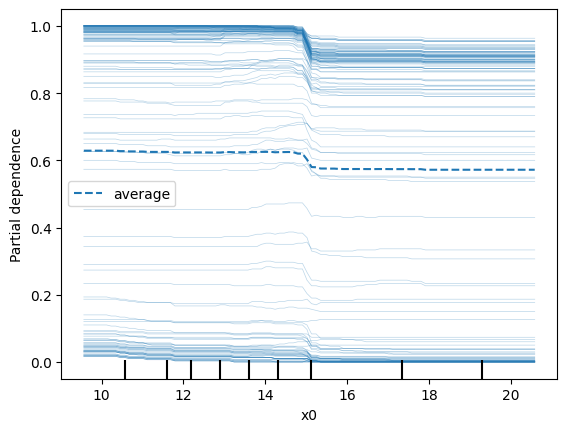

In [6]:
PartialDependenceDisplay.from_estimator(estimator=rf, X=X_test, features=[0], kind='both', centered=False)

Давайте также посмотрим на эти графики для логистической регрессии.

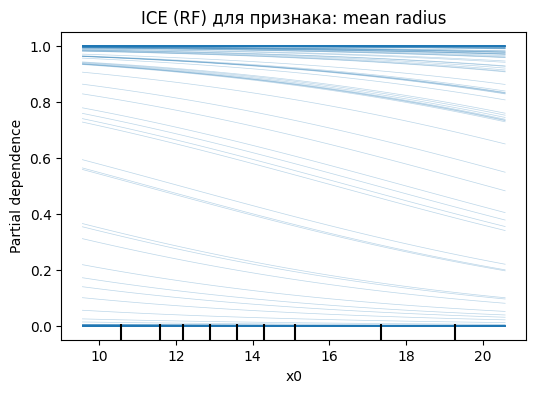

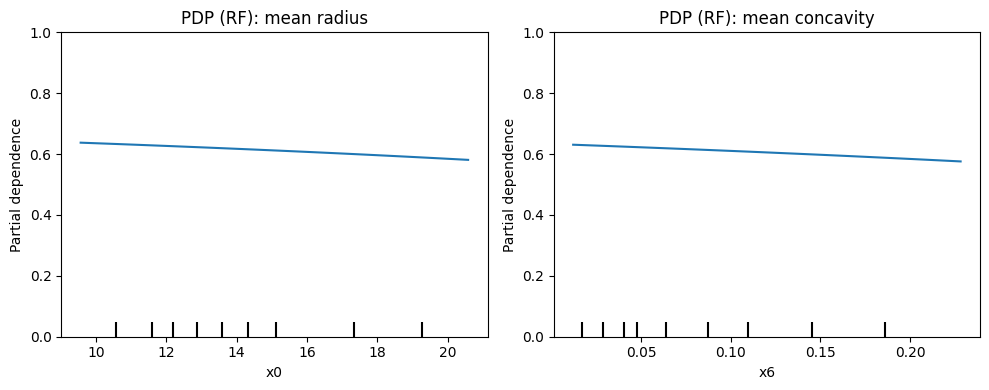

In [23]:
# ICE LR
fig_ice, ax = plt.subplots(figsize=(6,4))
PartialDependenceDisplay.from_estimator(
    logreg, X_test, features=[feat_idx_ice[0]], kind="individual", grid_resolution=30, ax=ax
)
ax.set_title(f"ICE (RF) для признака: {feature_names[feat_idx_ice[0]]}")
plt.show()

# PDP для двух признаков
fig_pdp, axes = plt.subplots(1, 2, figsize=(10,4))
PartialDependenceDisplay.from_estimator(logreg, X_test, [0, 6], ax=axes, grid_resolution=30)
axes[0].set_title(f"PDP (RF): {feature_names[0]}")
axes[1].set_title(f"PDP (RF): {feature_names[6]}")

for ax in axes:
  ax.set_ylim(0, 1) # чтобы масштаб отображения изменений был верный

plt.tight_layout()
plt.show()

ICE + PDP на одном графике для признака mean_redius

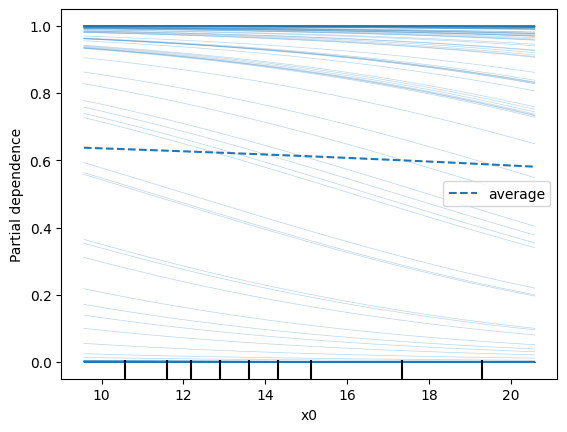

In [27]:
PartialDependenceDisplay.from_estimator(estimator=logreg, X=X_test, features=[0], kind='both', grid_resolution=30)

Зафиксируем, что мы видим.

Регрессия:

- **Гладкие монотонные кривые** (S-образные или близкие к линейным)
- **Без резких изломов** и ступенек

Случайный лес
- **Нелинейные** с изломами и плато
- **Негладкие** (ступенчатые из-за структуры деревьев)


**Почему?**

Логистическая регрессия имеет структуру: `P(y=1) = sigmoid(β₀ + β₁x₁ + ... + βₙxₙ)`

Внутри модели **линейная комбинация** признаков. То есть суммарный прогноз аддитивен по признакам, умноженным на их важность, а влияние каждого признака независимо от других со своим коэффициентом. Кроме того, так как, в самой модели нет взаимодействий между признаками, PDP будет почти идентичен ALE, на который мы также посмотрим далее.

Следовательно для логистической регрессии ALE/PDP избыточны - достаточно посмотреть на коэффициенты модели. Если β > 0, то рост признака увеличивает вероятность класса 1, иначе — уменьшает.

Дерево же разбивает прогнозы на листья, где в каждом листе содержится *отрезок* прогнозируемого значения. Это и дает ступеньки и негладкие функции при непрерывном изменении по признакам.


#### Посмотрим на графики ICE + PDP для 12 признаков для RF

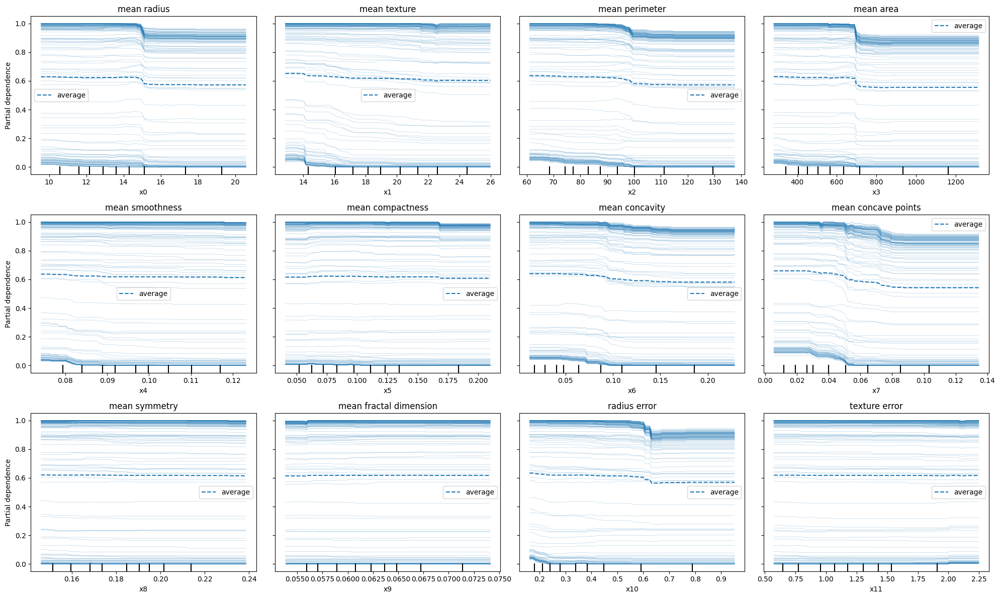

In [54]:
fig, axes = plt.subplots(3, 4, figsize=(20, 12))
PartialDependenceDisplay.from_estimator(estimator=rf, X=X_test, features=range(0, 12), kind='both', ax=axes)

for ax, feat_name in zip(axes.reshape(-1), feature_names[:12]):
  ax.set_title(feat_name)

plt.tight_layout()

### Посмотрим на парные зависимости признаков друг от друга

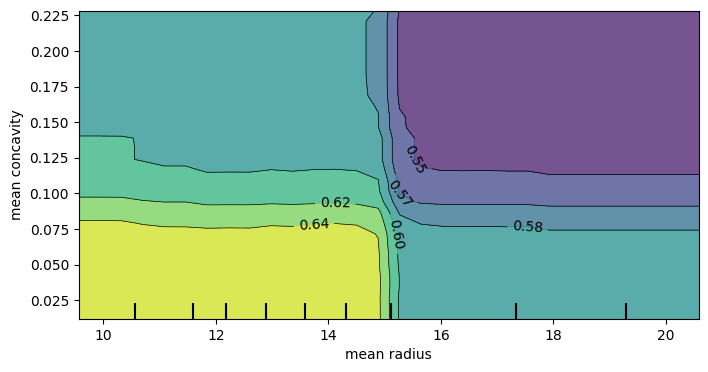

In [62]:
# признаки mean_radius, min_concavity
fig, ax = plt.subplots(figsize=(8, 4))
PartialDependenceDisplay.from_estimator(rf, X_test, [(0, 6)], ax=ax, grid_resolution=30, feature_names=feature_names)

## 3. **Графический вклад: ALE**

Перейдем к ALE. Напомню его алгоритм ALE

1. Выбрать интересующий признак $F$

2. Разделить диапазон изменения признака на интервалы $[x_F^{(k)}, x_F^{(k+1)}]$, где $k = 1, 2, ..., K - 1$.

3. Для каждого интервала:

   а) Заменить признак на значение нижней границы интервала и рассчитать прогнозы модели $f(x_F^{(k)}, S_j)$
   
   б) Заменить признак на значение верхней границы интервала и рассчитать прогнозы модели $f(x_F^{(k+1)}, S_j)$
   
   в) Усреднить разницу в прогнозах между (а) и (б) согласно количеству объектов в интервале.

4. Суммировать эффекты по всем интервалам и далее усреднить полученный эффект по наблюдениям:

   $f_{F,centeredALE} = f_{F,ALE} - (1/n) * Σ_{k=1}^K N_j(k) * f_{F,ALE}$

Шаги "а", "б" — являются компонентами эффекта, а шаг "в" — локальности.

ALE требует установки дополнительной неклассической библиотеки, причем достаточно старой. Поэтому его можно либо писать самостоятельно, либо, если проект позволяет — просто поставить pyALE. Рассмотрим оба варианта.

In [ ]:
!pip install -qU pyALE;

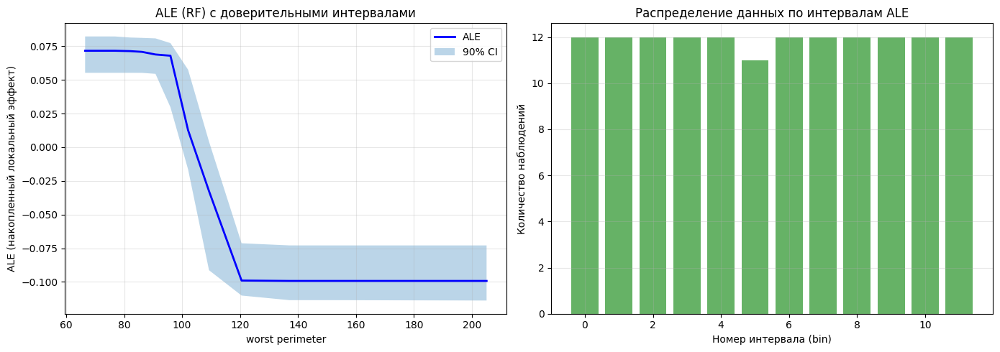


Статистика по ALE для признака 'worst perimeter':
Средняя ширина доверительного интервала: 0.0426


In [ ]:
def ale_1d(model, X, j, K=10, n_bootstrap=None, ci_level=90, random_state=42):
    """
    Вычисление ALE (Accumulated Local Effects) с ДИ
    """

    # Шаг 1: Подготовка интервалов (bins)
    # -------------------------------------
    xj = X[:, j]  # Извлекаем значения j-го признака

    # Разбиваем диапазон признака на K+1 квантилей (границы K интервалов)
    # дубликаты границ могут возникать при дискретных или категориальных признаках,
    # а также при признаках с большим количеством повторяющихся значений (пример 1)
    qs = np.quantile(xj, np.linspace(0, 1, K+1))

    # Убираем дубликаты границ
    qs = np.unique(qs)

    # Кколичество интервалов
    K_eff = len(qs) - 1

    # Инициализация массивов
    effects = np.zeros(K_eff)      # Локальные эффекты в каждом интервале
    counts = np.zeros(K_eff, dtype=int)  # Количество точек в интервале

    # Шаг 2: Основной расчет ALE
    # ---------------------------
    for k in range(K_eff):
        left, right = qs[k], qs[k+1]  # Границы k-го интервала

        # # Определяем значения, попавшие в интервал
        if k == K_eff - 1:
            mask = (xj >= left) & (xj <= right)  # Для последнего включаем правую границу
        else:
            mask = (xj >= left) & (xj < right)   # Полуинтервал [left, right)

        idx = np.where(mask)[0]  # Индексы точек в интервале

        # # Пропускаем пустые интервалы
        if len(idx) == 0:
            continue

        # Создаем копии подвыборки
        X_left = X[idx].copy()
        X_right = X[idx].copy()

        # Заменяем значение признака j на границы интервала
        # Ключевая идея ALE: локальный эффект при малом сдвиге
        X_left[:, j] = left
        X_right[:, j] = right

        # Получаем предсказания для обоих случаев
        p_left = model.predict_proba(X_left)[:, 1]
        p_right = model.predict_proba(X_right)[:, 1]

        # Локальный эффект = разность предсказаний
        diff = p_right - p_left

        # Усредняем по точкам в интервале
        effects[k] = diff.mean()
        counts[k] = len(idx)

    # Шаг 3: Накопление и центрирование
    # ----------------------------------

    # Накапливаем локальные эффекты (cumulative sum)
    ale = np.cumsum(effects)

    # Центрируем относительно взвешенного среднего
    w = counts.copy().astype(float)
    w[w == 0] = 1.0  # Избегаем деления на 0
    ale = ale - np.average(ale, weights=w)

    # Координаты центров интервалов для графика
    grid = 0.5 * (qs[:-1] + qs[1:])

    # Шаг 4: Bootstrap для доверительных интервалов (опционально)
    # ------------------------------------------------------------
    ale_lower, ale_upper = None, None

    if n_bootstrap is not None and n_bootstrap > 0:
        ale_bootstrap = []
        rng = np.random.default_rng(random_state)

        # Запускаем bootstrap итерации
        for _ in range(n_bootstrap):
            # Создаем bootstrap выборку
            idx_boot = rng.choice(len(X), size=len(X), replace=True)
            X_boot = X[idx_boot]

            # Рекурсивно вызываем функцию без bootstrap (n_bootstrap=None)
            # чтобы избежать бесконечной рекурсии
            _, ale_boot, _, _, _, _, _ = ale_1d(model, X_boot, j, K, n_bootstrap=None)
            ale_bootstrap.append(ale_boot)

        # Преобразуем в матрицу
        ale_bootstrap = np.array(ale_bootstrap)

        # Вычисляем процентили для доверительного интервала
        lower_percentile = (100 - ci_level) / 2
        upper_percentile = 100 - lower_percentile

        ale_lower = np.percentile(ale_bootstrap, lower_percentile, axis=0)
        ale_upper = np.percentile(ale_bootstrap, upper_percentile, axis=0)

    return grid, ale, effects, counts, qs, ale_lower, ale_upper



# # Пример использования без CI можно прогнать после семинара — будет быстрее:
# grid, ale, effects, counts, qs, _, _ = ale_1d(
#     rf, X_test, 0, K=12, n_bootstrap=None
# )

feat_idx_ale = 22

# А мы прогоним с CI
grid, ale, effects, counts, qs, ale_lower, ale_upper = ale_1d(
    rf, X_test, 22, K=12, n_bootstrap=20, ci_level=90
)

fig, axes = plt.subplots(1, 2, figsize=(14,5))

# ALE с доверительными интервалами
axes[0].plot(grid, ale, lw=2, label='ALE', color='blue')
axes[0].fill_between(grid, ale_lower, ale_upper, alpha=0.3, label='90% CI')
axes[0].set_xlabel(feature_names[feat_idx_ale])
axes[0].set_ylabel("ALE (накопленный локальный эффект)")
axes[0].set_title(f"ALE (RF) с доверительными интервалами")
axes[0].legend()
axes[0].grid(alpha=0.3)

# Распределение данных по bins
axes[1].bar(range(len(counts)), counts, alpha=0.6, color='green')
axes[1].set_xlabel("Номер интервала (bin)")
axes[1].set_ylabel("Количество наблюдений")
axes[1].set_title("Распределение данных по интервалам ALE")
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nСтатистика по ALE для признака '{feature_names[feat_idx_ale]}':")
print(f"Средняя ширина доверительного интервала: {np.mean(ale_upper - ale_lower):.4f}")



In [ ]:
# тонкости
# пример 1
# Возраст пациентов с большой группой 65 людей
ages = np.array([25, 30, 35, 40, 65, 65, 65, 65, 65, 65, 65, 65, 65, 70])

K = 5
qs = np.quantile(ages, np.linspace(0, 1, K+1))

print("Квантили ДО unique:")
print(qs)

qs_unique = np.unique(qs)
print("\nКвантили ПОСЛЕ unique:")
print(qs_unique)

Квантили ДО unique:
[25. 38. 65. 65. 65. 70.]

Квантили ПОСЛЕ unique:
[25. 38. 65. 70.]


INFO:PyALE._ALE_generic:Continuous feature detected.
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


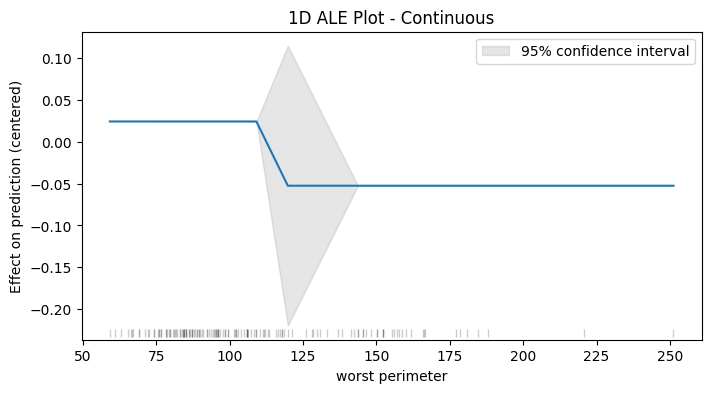

In [ ]:
from PyALE import ale as ALE

## 1D - continuous - no CI
ale_eff = ALE(
    X=pd.DataFrame(X_test, columns=feature_names), model=rf, feature=[feature_names[22]], grid_size=11, include_CI=True
)

In [ ]:
np.corrcoef(ale_eff['eff'], ale) # если бы мы сотрели на признак с менее сильным влиянием, так красиво бы не вышло — библиотечный ALE может уходить в 0 из-за точности огругления

array([[1.        , 0.92062265],
       [0.92062265, 1.        ]])

## **4. Корреляция ALE vs PDP**

**Когда они различаются:**
- PDP может показывать ложные зависимости при коррелированных признаках
- ALE изолирует эффект конкретного признака

Давайте сравним на нескольких признаках:


In [64]:
rf_data = pd.DataFrame(rf.feature_importances_, feature_names, columns=['imp']).reset_index().reset_index()
rf_data.columns = ['index', 'name', 'imp']
rf_data.sort_values(by='imp', ascending=False)

,index,name,imp
22,22,worst perimeter,0.145686
23,23,worst area,0.144090
27,27,worst concave points,0.114607
7,7,mean concave points,0.098307
20,20,worst radius,0.072351
0,0,mean radius,0.060713
2,2,mean perimeter,0.055987
6,6,mean concavity,0.045211
3,3,mean area,0.036753
26,26,worst concavity,0.028162


In [65]:
best_indexes = np.argsort(rf.feature_importances_)[:3]
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html

for feature_idx in best_indexes:
  print(f'Feature: \n{rf_data[rf_data['index'] == feature_idx]}')
  correlations = np.corrcoef(X_test, rowvar=False)[feature_idx]

  # Сортируем
  sorted_idx = np.argsort(np.abs(correlations))[::-1]
  print('TOP-3 corrcoefs: ', correlations[sorted_idx][:4])


Feature: 
    index            name       imp
18     18  symmetry error  0.003714
TOP-3 corrcoefs:  [1.         0.4990852  0.48571217 0.40410831]
Feature: 
   index           name       imp
8      8  mean symmetry  0.003751
TOP-3 corrcoefs:  [1.         0.60616472 0.58742634 0.5871831 ]
Feature: 
   index                    name       imp
9      9  mean fractal dimension  0.003937
TOP-3 corrcoefs:  [1.         0.75092533 0.688755   0.6617829 ]


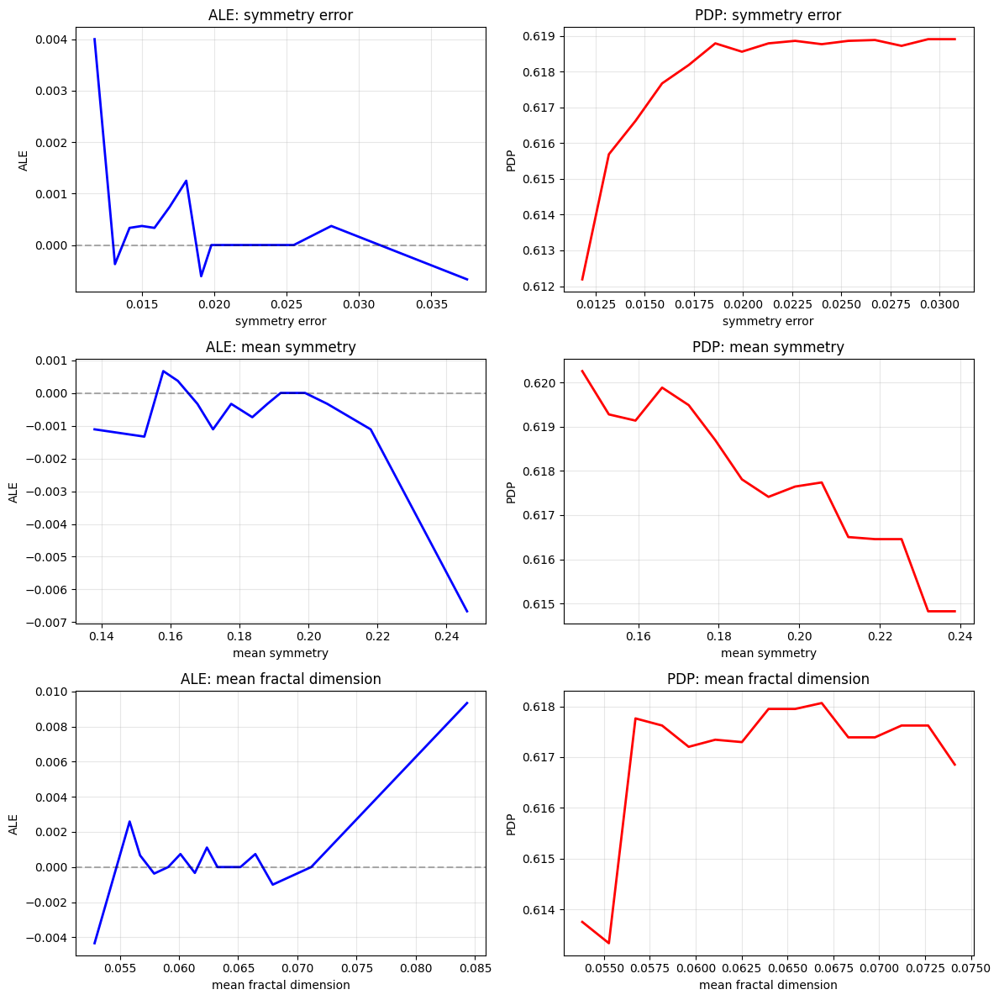

In [ ]:
from sklearn.inspection import partial_dependence

def compare_ale_pdp(model, X, features_to_compare, feature_names):
    """Сравнение ALE и PDP для нескольких признаков"""
    n_features = len(features_to_compare)
    fig, axes = plt.subplots(n_features, 2, figsize=(12, 4*n_features))
    if n_features == 1:
        axes = axes.reshape(1, -1)

    for i, feat_idx in enumerate(features_to_compare):
        # ALE
        grid_ale, ale, effects, _, _, _, _ = ale_1d(model, X, feat_idx, K=15)
        axes[i, 0].plot(grid_ale, effects, lw=2, color='blue')
        axes[i, 0].set_xlabel(feature_names[feat_idx])
        axes[i, 0].set_ylabel("ALE")
        axes[i, 0].set_title(f"ALE: {feature_names[feat_idx]}")
        axes[i, 0].grid(alpha=0.3)
        axes[i, 0].axhline(y=0, color='k', linestyle='--', alpha=0.3)

        # PDP
        pd_resu lt = partial_dependence(model, X, [feat_idx], grid_resolution=15)
        axes[i, 1].plot(pd_result['grid_values'][0], pd_result['average'][0], lw=2, color='red')
        axes[i, 1].set_xlabel(feature_names[feat_idx])
        axes[i, 1].set_ylabel("PDP")
        axes[i, 1].set_title(f"PDP: {feature_names[feat_idx]}")
        axes[i, 1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# Сравним несколько признаков
features_to_compare = best_indexes
compare_ale_pdp(rf, X_test, features_to_compare, feature_names)



**Как быть с категориальными признаками?**

Зависит от кодировки значений. ALE не определён в классическом виде (нет понятия "локального эффекта" между дискретными значениями). PDP работает, но показывает среднее предсказание для каждой категории. Для логистической регрессии достаточно просто посмотреть на коэффициенты dummy-переменных и в целом ALE и PDP на категориях обычно не смотрят (зато можно красить по категориям ICE).



## **5. Permutation Importance + Сравнение с Tree-based Importance**

Перестановочная важность тоже реализована в sklearn. И этот метод, на самом деле, как и другие, представляет собой частный случай важности при помощи внесения **возмущений** в признак. Возмущения могут быть разных видов:

- внесение случайного шума;
- зануление признака (удобно для изображений);
- сдвиг признака к его базовому значению и оценка траектории изменения прогнозов или качества модели;

А здесь наше возмущение — случайная перестановка. Оценка важности признаков на основе возмущений — отдельный аппрат XAI, с которым можно встретиться при погружении в тему. Но пока посмотрим на перестановочную важность из коробки.

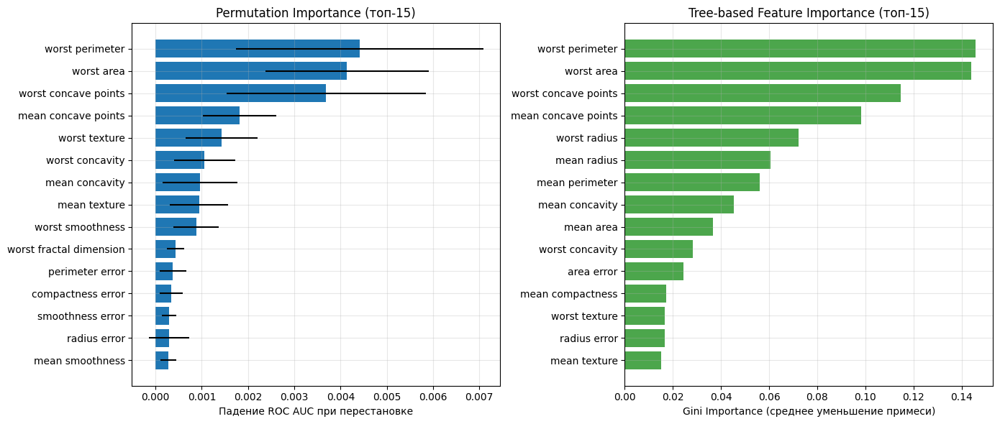

In [ ]:
from sklearn.inspection import permutation_importance

# Permutation importance
r = permutation_importance(
    rf, X_test, y_test, n_repeats=10, random_state=42, scoring='roc_auc'
)

# Tree-based importance (встроенная в RF)
tree_importance = rf.feature_importances_

# Топ-15 признаков для обоих методов
idx_perm = np.argsort(r.importances_mean)[::-1][:15]
idx_tree = np.argsort(tree_importance)[::-1][:15]

# Визуализация сравнения
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# Permutation Importance
axes[0].barh(range(len(idx_perm)), r.importances_mean[idx_perm], xerr=r.importances_std[idx_perm])
axes[0].set_yticks(range(len(idx_perm)))
axes[0].set_yticklabels([feature_names[i] for i in idx_perm])
axes[0].invert_yaxis()
axes[0].set_xlabel("Падение ROC AUC при перестановке")
axes[0].set_title("Permutation Importance (топ-15)")
axes[0].grid(alpha=0.3)

# Tree-based Importance
axes[1].barh(range(len(idx_tree)), tree_importance[idx_tree], color='green', alpha=0.7)
axes[1].set_yticks(range(len(idx_tree)))
axes[1].set_yticklabels([feature_names[i] for i in idx_tree])
axes[1].invert_yaxis()
axes[1].set_xlabel("Gini Importance (среднее уменьшение примеси)")
axes[1].set_title("Tree-based Feature Importance (топ-15)")
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


Как видите, важности очень похожи. Однако справедливо следующее.

**Permutation Importance**
+ Модель-агностичный
+ Учитывает взаимодействия признаков —  вернее, ломает его
- Делит важность между коррелированными признаками
- Вычислительно дорогой

**Tree-based Importance:**
+ Быстрый (не требует перепредсказаний)
+ Встроен в модель — но не обобщаем на другие модели
- Завышает важность high-cardinality признаков — можно лечить масштабированием
- Может быть неинформативен на тесте (bias к обучающей выборке)

In [67]:
a = np.array([1, 2, 3, 4, 5])
b = np.tile(a, (3, 1))
b

array([[1, 2, 3, 4, 5],
       [1, 2, 3, 4, 5],
       [1, 2, 3, 4, 5]])

## 6. **Локальный суррогат (LIME-style)**


Суррогатные модели — тоже не унифицированная идея LIME. В теории (и на практике) можно построить суррогатное дерево небольшой глубины — и получить также интерпретируемый алгоритм. LIME устоялся в силу универсальности.

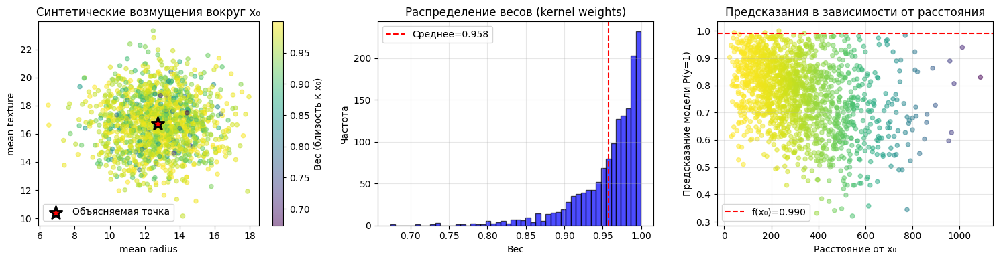


Интерпретация визуализаций:
1. Левый график: точки ближе к x₀ (красная звезда) имеют больший вес (светлее)
2. Средний график: большинство точек имеют малый вес → локальная аппроксимация
3. Правый график: как предсказания изменяются при удалении от x₀


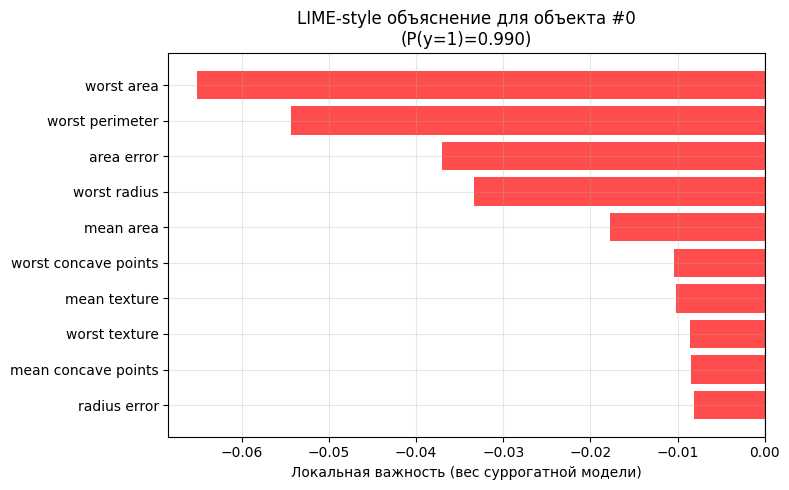

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.metrics.pairwise import pairwise_distances

def lime_style_explain(model, x0, X_ref, sigma=0.5, n_samples=1000, kernel_width=None, random_state=42):
    """
    LIME-style локальное объяснение предсказания модели
    """
    rng = np.random.default_rng(random_state)  # фикс
    # Создаем матрицу, где каждая строка  копия x0
    # Shape: (n_samples, n_features)
    X0 = np.tile(x0, (n_samples, 1)) # по Y повторить n_samples раз, по X - 1 раз

    # Вычисляем стандартное отклонение каждого признака в референсной выборке — это можно сделать для адаптивного масштабирования шума:
    # - признаки с большим разбросом получат больший шум
    # - признаки с малым разбросом получат меньший шум
    std = X_ref.std(axis=0) + 1e-9

    # Генерируем гауссовский шум с масштабом sigma * std Z = x0 + шум  →  создаем облако точек вокруг x0
    # sigma контролирует размер облака:
    # - sigma=0.1 → очень локальное объяснение (точки близко к x0)
    # - sigma=1.0 → более глобальное объяснение (точки далеко от x0)
    Z = X0 + rng.normal(scale=sigma * std, size=X0.shape)

    # Получаем вероятность класса 1 для каждой точки — прогнозы blackbox
    y = model.predict_proba(Z)[:, 1]


    # Вычисляем евклидово расстояние от каждой синтетической точки до x0
    # pairwise_distances возвращает матрицу (n_samples, 1), берем первый столбец
    dists = pairwise_distances(Z, x0.reshape(1, -1), metric='euclidean').ravel()

    # Автоматический выбор ширины ядра (если не задана)
    # Эвристика из статьи: sqrt(n_features) * median(distances)
    if kernel_width is None:
        kernel_width = np.sqrt(Z.shape[1]) * np.median(dists + 1e-9) * 0.75

    # RBF (Radial Basis Function) kernel: exp(-d²/(2σ²))
    # Гауссово ядро, которое присваивает веса:
    # - точки близко к x0 (малый d) → вес ≈ 1
    # - точки далеко от x0 (большой d) → вес ≈ 0
    # kernel_width управляет скоростью убывания весов
    weights = np.exp(-(dists**2) / (2 * kernel_width**2))

    # Готовимся учить модель б стандартизации коэффициенты будут зависеть от масштаба признаков
    Z_std = (Z - Z.mean(axis=0)) / (Z.std(axis=0) + 1e-9)

    # Обучаем Ridge регрессию (линейная модель с L2-регуляризацией)
    # - Ridge помогает избежать переобучения (важно при n_samples ~ n_features)
    # - sample_weight=weights → точки ближе к x0 влияют сильнее на обучение
    reg = Ridge(alpha=1.0, random_state=42)
    reg.fit(Z_std, y, sample_weight=weights)

    return reg.coef_, reg.intercept_, Z, y, weights, dists

# Пример объяснения для первого объекта теста
x0 = X_test[0]
coefs, intercept, Z_pert, y_pert, weights, dists = lime_style_explain(
    rf, x0, X_test, sigma=0.5, n_samples=1500, random_state=42
)

# Визуализация возмущений в 2D (первые два признака)
fig, axes = plt.subplots(1, 3, figsize=(15,4))

# 1. Scatter plot возмущений
scatter = axes[0].scatter(Z_pert[:, 0], Z_pert[:, 1], c=weights, cmap='viridis',
                         alpha=0.5, s=20)
axes[0].scatter(x0[0], x0[1], c='red', s=200, marker='*', edgecolors='black', linewidth=2,
               label='Объясняемая точка')
axes[0].set_xlabel(f"{feature_names[0]}")
axes[0].set_ylabel(f"{feature_names[1]}")
axes[0].set_title("Синтетические возмущения вокруг x₀")
axes[0].legend()
plt.colorbar(scatter, ax=axes[0], label='Вес (близость к x₀)')

# 2. Распределение весов
axes[1].hist(weights, bins=50, alpha=0.7, color='blue', edgecolor='black')
axes[1].set_xlabel("Вес")
axes[1].set_ylabel("Частота")
axes[1].set_title("Распределение весов (kernel weights)")
axes[1].axvline(weights.mean(), color='red', linestyle='--', label=f'Среднее={weights.mean():.3f}')
axes[1].legend()
axes[1].grid(alpha=0.3)

# 3. Предсказания vs расстояние
axes[2].scatter(dists, y_pert, c=weights, cmap='viridis', alpha=0.5, s=20)
axes[2].axhline(y=rf.predict_proba([x0])[0,1], color='red', linestyle='--',
                label=f'f(x₀)={rf.predict_proba([x0])[0,1]:.3f}')
axes[2].set_xlabel("Расстояние от x₀")
axes[2].set_ylabel("Предсказание модели P(y=1)")
axes[2].set_title("Предсказания в зависимости от расстояния")
axes[2].legend()
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\nИнтерпретация визуализаций:")
print("1. Левый график: точки ближе к x₀ (красная звезда) имеют больший вес (светлее)")
print("2. Средний график: большинство точек имеют малый вес → локальная аппроксимация")
print("3. Правый график: как предсказания изменяются при удалении от x₀")

# Локальные важности
order = np.argsort(np.abs(coefs))[::-1][:10]
labels = [feature_names[i] for i in order]

fig, ax = plt.subplots(figsize=(8,5))
colors = ['green' if c > 0 else 'red' for c in coefs[order]]
ax.barh(range(len(order)), coefs[order], color=colors, alpha=0.7)
ax.set_yticks(range(len(order)))
ax.set_yticklabels(labels)
ax.invert_yaxis()
ax.set_xlabel("Локальная важность (вес суррогатной модели)")
ax.set_title(f"LIME-style объяснение для объекта #0\n(P(y=1)={rf.predict_proba([x0])[0,1]:.3f})")
ax.axvline(x=0, color='black', linestyle='-', linewidth=0.8)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


В нашем варианте мы сделали много адаптаций. Сравнимся с библиотечным вариантом.

In [68]:
!pip install lime -q;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [69]:
from lime.lime_tabular import LimeTabularExplainer #посмотрим, что дает библиотечная реализация


data_point = X_test[0, :]
explainer = LimeTabularExplainer(X_train,
                                # class_names=
                                 feature_names=feature_names,
                                 kernel_width=np.sqrt(len(feature_names)) * 0.75,
                                 verbose=False,
                                 mode='classification',
                                 discretize_continuous=False)

exp_rf = explainer.explain_instance(data_point, rf.predict_proba, top_labels=1)
exp_rf.show_in_notebook()

## 6.1. Сравнение локальных объяснений для разных объектов

Покажем, как объяснения различаются для разных объекто, помните что LIME — **локален**. Так как тут медицинская задача — мы смотрим на признаки для каждого отдельного пациента.


Выбранные объекты для сравнения:
1. Объект #1: P(malignant)=0.000 (уверенно доброкачественная)
2. Объект #88: P(malignant)=0.570 (пограничный случай)
3. Объект #11: P(malignant)=1.000 (уверенно злокачественная)



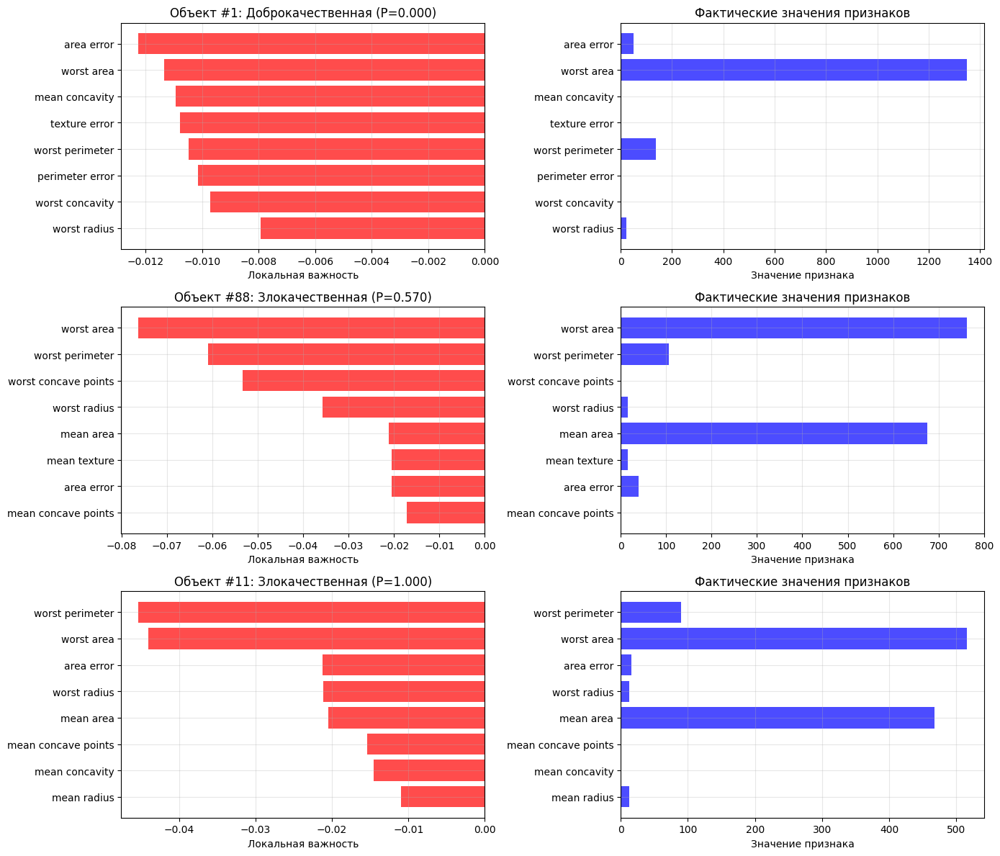

In [ ]:
def compare_local_explanations(model, X, indices, feature_names, n_top=8):
    """Сравнение локальных объяснений для нескольких объектов"""
    n_instances = len(indices)
    fig, axes = plt.subplots(n_instances, 2, figsize=(14, 4*n_instances))
    if n_instances == 1:
        axes = axes.reshape(1, -1)

    all_explanations = []

    for i, idx in enumerate(indices):
        x = X[idx]
        pred = model.predict_proba([x])[0, 1]
        pred_class = "Доброкачественная" if pred < 0.5 else "Злокачественная"

        # LIME объяснение
        coefs, _, _, _, _, _ = lime_style_explain(
            model, x, X, sigma=0.5, n_samples=1000, random_state=42+i
        )

        # Топ признаки
        order = np.argsort(np.abs(coefs))[::-1][:n_top]
        labels = [feature_names[j] for j in order]
        colors = ['green' if c > 0 else 'red' for c in coefs[order]]

        all_explanations.append((order, coefs[order]))

        # График важностей
        axes[i, 0].barh(range(len(order)), coefs[order], color=colors, alpha=0.7)
        axes[i, 0].set_yticks(range(len(order)))
        axes[i, 0].set_yticklabels(labels)
        axes[i, 0].invert_yaxis()
        axes[i, 0].set_xlabel("Локальная важность")
        axes[i, 0].set_title(f"Объект #{idx}: {pred_class} (P={pred:.3f})")
        axes[i, 0].axvline(x=0, color='black', linestyle='-', linewidth=0.8)
        axes[i, 0].grid(alpha=0.3)

        # Значения признаков
        feature_vals = x[order]
        axes[i, 1].barh(range(len(order)), feature_vals, alpha=0.7, color='blue')
        axes[i, 1].set_yticks(range(len(order)))
        axes[i, 1].set_yticklabels(labels)
        axes[i, 1].invert_yaxis()
        axes[i, 1].set_xlabel("Значение признака")
        axes[i, 1].set_title(f"Фактические значения признаков")
        axes[i, 1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    return all_explanations

# Выберем 3 разных объекта:
# - Уверенно доброкачественная
# - Уверенно злокачественная
# - Пограничный случай

probs = rf.predict_proba(X_test)[:, 1]
benign_idx = np.argmin(probs)
malignant_idx = np.argmax(probs)
boundary_idx = np.argmin(np.abs(probs - 0.5))  # Ближе всего к 0.5

print("Выбранные объекты для сравнения:")
print(f"1. Объект #{benign_idx}: P(malignant)={probs[benign_idx]:.3f} (уверенно доброкачественная)")
print(f"2. Объект #{boundary_idx}: P(malignant)={probs[boundary_idx]:.3f} (пограничный случай)")
print(f"3. Объект #{malignant_idx}: P(malignant)={probs[malignant_idx]:.3f} (уверенно злокачественная)")
print()

explanations = compare_local_explanations(
    rf, X_test, [benign_idx, boundary_idx, malignant_idx], feature_names
)


In [ ]:
data_point = X_test[benign_idx, :]
explainer = LimeTabularExplainer(X_train,
                                # class_names=
                                 feature_names=feature_names,
                                 kernel_width=np.sqrt(len(feature_names)) * 0.75,
                                 verbose=False,
                                 mode='classification',
                                 discretize_continuous=False,
                                 sample_around_instance=False)

exp_rf = explainer.explain_instance(data_point, rf.predict_proba, top_labels=1)
exp_rf.show_in_notebook()

In [ ]:
data_point = X_test[boundary_idx, :]
explainer = LimeTabularExplainer(X_train,
                                # class_names=
                                 feature_names=feature_names,
                                 kernel_width=np.sqrt(len(feature_names)) * 0.75,
                                 verbose=False,
                                 mode='classification',
                                 discretize_continuous=False,
                                 sample_around_instance=False)

exp_rf = explainer.explain_instance(data_point, rf.predict_proba, top_labels=1)
exp_rf.show_in_notebook()

In [ ]:
data_point = X_test[malignant_idx, :]
explainer = LimeTabularExplainer(X_train,
                                # class_names=
                                 feature_names=feature_names,
                                 kernel_width=np.sqrt(len(feature_names)) * 0.75,
                                 verbose=False,
                                 mode='classification',
                                 discretize_continuous=False,
                                 sample_around_instance=False)

exp_rf = explainer.explain_instance(data_point, rf.predict_proba, top_labels=1)
exp_rf.show_in_notebook()


Выводы из сравнения:
- Разные объекты имеют РАЗНЫЕ важные признаки
- Направление влияния (знак) может меняться
- Пограничные случаи часто имеют конфликтующие признаки
- Это показывает ценность ЛОКАЛЬНЫХ объяснений!

## **7. Практикум с библиотекой SHAP**

Теперь познакомимся с shap. Руками его писать не придется — метод устоявшийся, популярный и обновляемый — последний коммит 3 месяца назад, в отличие от LIME, где обновление не проводилось несколько лет (возможно в связи с тем, что оно и не нужно).

**Установка:** `pip install shap`


Графики shap — это бесконечная красота и искусство! Давайте посмотрим на разные их типы.

In [71]:
import shap
#Локальное объяснение с shap

shap.initjs()
explainer_rf = shap.TreeExplainer(rf, feature_names=feature_names)
shap_values_rf = explainer_rf(X_train)

X_train_df = pd.DataFrame(X_train, columns=feature_names)

In [73]:
# values - shap-values для каждого признака (1 колонда для предикта 0, вторая колонка для предикта 1)
# base_values - вероятности принадлежности к 0 и 1 классу
shap_values_rf.values[0], shap_values_rf.base_values[0]

(array([[ 0.03260891, -0.03260891],
        [ 0.00637061, -0.00637061],
        [ 0.03266989, -0.03266989],
        [ 0.03384085, -0.03384085],
        [ 0.00292445, -0.00292445],
        [ 0.00486954, -0.00486954],
        [ 0.0258416 , -0.0258416 ],
        [ 0.06606801, -0.06606801],
        [ 0.00043226, -0.00043226],
        [ 0.00175164, -0.00175164],
        [ 0.00758535, -0.00758535],
        [ 0.00217471, -0.00217471],
        [ 0.00331158, -0.00331158],
        [ 0.03009363, -0.03009363],
        [-0.00073052,  0.00073052],
        [ 0.00092542, -0.00092542],
        [ 0.00191081, -0.00191081],
        [ 0.001388  , -0.001388  ],
        [ 0.00140996, -0.00140996],
        [ 0.00112401, -0.00112401],
        [ 0.05570561, -0.05570561],
        [ 0.00416385, -0.00416385],
        [ 0.10768263, -0.10768263],
        [ 0.10870016, -0.10870016],
        [ 0.00525395, -0.00525395],
        [ 0.00099082, -0.00099082],
        [ 0.0212745 , -0.0212745 ],
        [ 0.07124757, -0.071

In [79]:
# глобальное поведение через force plot
shap.initjs()

# force plot отражает изменение shap-value вместе с изменением значения признака
# красный цвет - увеличение вероятности получения исследуемого класса, голубой - уменьшение вероятности получения исследуемого класса
# по Y - прогноз модели (если не выбирать что-то еще в выпадающем меню)
# по X - индексы объектов выборки (в порядке, выбранном в верхнем выпадающем меню)
# shap_values_rf[:, :, 0] - график для предсказания класса 0

shap.plots.force(shap_values_rf[:, :, 0]) # обратите внимание на срез — и посмотрим на парный [:, :, 1]

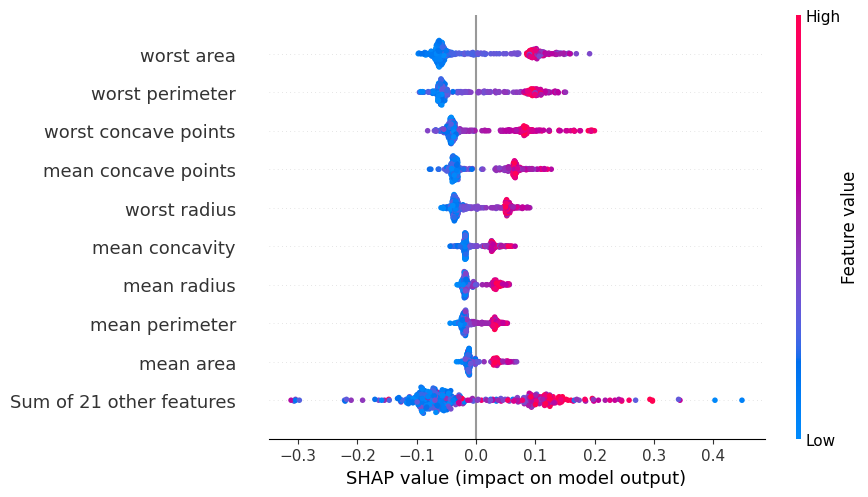

In [ ]:
shap.plots.beeswarm(shap_values_rf[:, :, 0])

In [ ]:
#Локальное объяснение с shap

shap.initjs()

# Визуализируем прогнозы для 7-го объекта в тренировочных данных
shap.plots.force(shap_values_rf[7, :, 0])

<Axes: xlabel='mean(|SHAP value|)'>

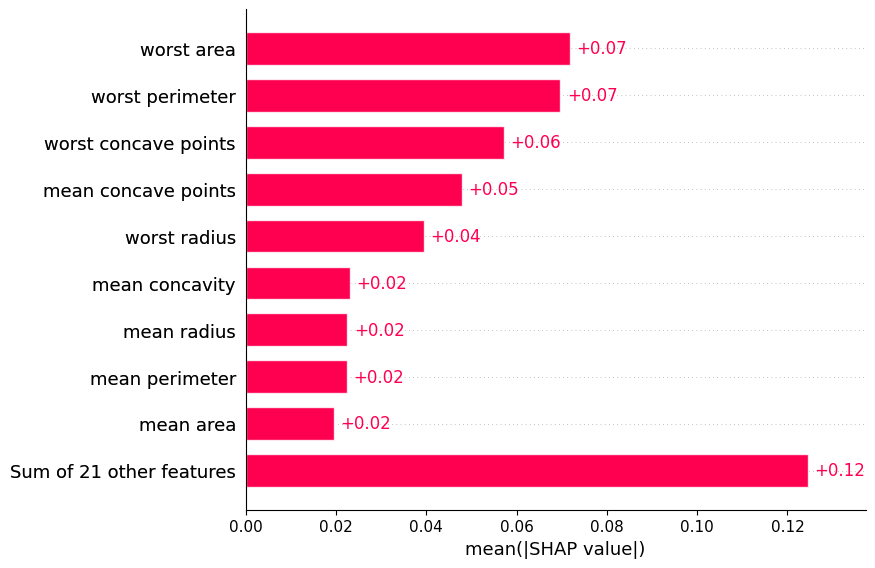

In [83]:
# Global Feature Importance
shap.plots.bar(shap_values_rf[:, :, 0])

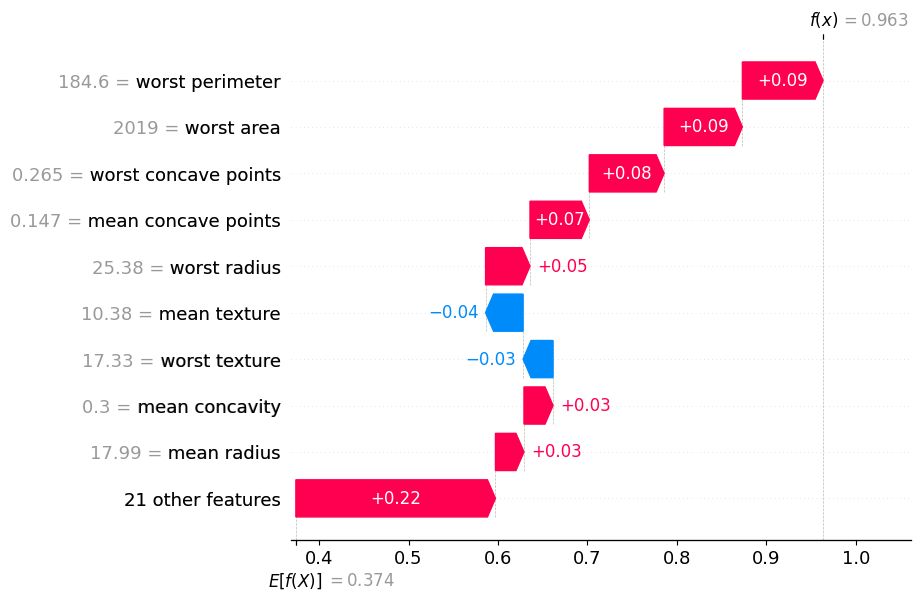

In [85]:
# Waterfall plot
shap.plots.waterfall(shap_values_rf[7, :, 0])

<Axes: xlabel='mean radius', ylabel='SHAP value for\nmean radius'>

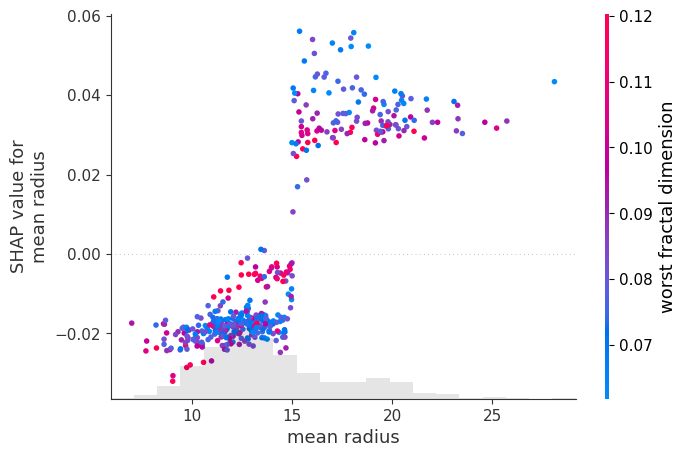

In [92]:
# Dependence plot
shap.plots.scatter(shap_values_rf[:, 0, 0], color=shap_values_rf[:, :, 0], show=False)

### **Теория: SHAP + categorical**


SHAP разлагает предсказание модели $f(x)$ на базовый уровень $\phi_0=\mathbb E[f(X)]$ и сумму вкладов признаков:

$$
f(x)=\phi_0+\sum_{j=1}^p \phi_j(x).
$$

Значение $\phi_j(x)$ — это «маржинальный вклад» признака $j$ вблизи точки $x$, усреднённый по всем коалициям признаков. Сумма SHAP по признакам всегда совпадает с предсказанием относительно базовой линии — отсюда удобство интерпретации и сравнимость вкладов.

Однако, вопреки этому удобству, SHAP имеет ограничения при работе с категориальными данными в разных кодировках.


1. OneHotEncoding. В этом случае каждому столбцу присвается свое значение Шепли. Общий вклад здесь — всегда **сумма** dummy-столбцов.
2. В CatBoost используется особый способ категориального разбиения, который (при использовании) фактически создаёт новые признаки для разбиения, отсутствующие в исходном наборе входных признаков. Эти признаки позволяют разбивать целые группы категорий тем или иным образом. Поддержка таких типов деревьев пока не реализована в SHAP, но можно использовать в CatBoost — встроенные [ShapValues](https://catboost.ai/docs/en/concepts/shap-values).
3. При других типах кодировок важно проверять отсутствие утечки.

## **8. Мини-практикум для самостоятельной работы**

Так как мы читаем XAI впервые, домашнего задания не будет =) Но я предлагаю вам ряд творческих задач, которые можно делать, а можно — нет. Но лучше, конечно, делать, чтобы получить знания, навыки и найти много, много красоты.

### **Основные задания:**

1. **Смена модели.** Обучите `GradientBoostingClassifier` и повторите анализ. Сравните объяснения с RandomForest.

2. **Стабильность LIME.** Запустите LIME 5 раз с разными random_state для одного объекта. Посчитайте стандартное отклонение важностей для каждого признака.

3. **Локальные vs глобальные.** Для 10 случайных объектов получите LIME объяснения. Усредните их и сравните с Permutation Importance. Похожи ли они?

4. **SHAP vs важности деревьев.** Сравните среднее |SHAP| по всем объектам с `feature_importances_` из RandomForest. Проанализируйте различия.

5. **Влияние гиперпараметров LIME.** Протестируйте разные значения `sigma` (0.1, 0.5, 1.0) и `kernel_width`. Как они влияют на объяснения?

### **Исследовательские задания:**

6. **Объяснение ошибок модели.** Найдите несколько ошибочно классифицированных объектов. Что говорят XAI методы о причинах ошибок?

7. **Сравнение моделей через XAI.** Обучите GradienBoosting Classifier и любой друой алгоритм. Попробуйте намеренно на уровне гиперпараметром сделать один алгоритм хуже другого.  Используйте изученные методы, чтобы понять, в чём поведение алгоритмов различается.



### **Практические советы:**

- Всегда используйте несколько методов для проверки
- Документируйте свои находки и предположения
- Обсуждайте результаты с domain expert'ами или коллегами — критический анализ важен в XAI
- Помните: XAI методы тоже могут ошибаться!
- Проверяйте стабильность объяснений

**Удачи в практике! =)**